# Análisis de datos de comunidades que usan Comunidad Feliz

##### ¿En que consiste el negocio de Comunidad Feliz?
Ofrecer un servio que permita a los administradores de condominios realizar su trabajo de forma mas eficiente garantizando la transparencia a la comunidad (Usaremos el alias CF para referirnos a Comunidad Feliz CF de ahora en adelante).

##### ¿Cuáles son las lineas de negocio de CF?
1. Línea SaaS (Registro y distribución de los gastos, registro de pagos)
2. Línea de Pagos (Gestión de los pagos de los condóminos por concepto de cuota de mantenimiento)
3. Residentes (Interfaz de valor para los usuarios)

##### ¿Quien soy? Y ¿Por qué uso datos de CF?
Mi nombre es Darío Manzano, trabajé como ingeniero petrolero por por 6 años hasta la pandemia. Buscando trabajo encontré esta startup llamada Comunidad Feliz en donde me ofrecieron la oportunidad de trabajar como ejecutivo de soporte y la oportunidad de crecer y desarrollarme en lo que quiera.

Comienzo como soporte (Atendiendo el teléfono) y con mucha constancia, disciplina y muchísimo estudio ahora trabajo directamente con la base de datos de producción de la compañía, realizando correcciones/modificaciones/investigaciones sobre los datos de nuestros clientes, nuestra aplicación esta construida en Ruby on Rails y uso la ORM de Rails para realizar mi trabajo día a día.

Mi objetivo es evolucionar a un Analista de Datos dentro de mi compañía y aportar valor usando las tecnologías aprendida para también poder aportar predicciones. Actualmente no se realiza Machine Learning ni Deeplearning por lo que ser el primero sería dar el puntapié inicial para comenzar.

##### ¿Quien soy? Y ¿Por qué uso datos de CF?
Mi nombre es Darío Manzano, trabajé como ingeniero petrolero por por 6 años hasta la pandemia. Buscando trabajo encontré esta startup llamada Comunidad Feliz en donde me ofrecieron la oportunidad de trabajar como ejecutivo de soporte y la oportunidad de crecer y desarrollarme en lo que quiera.

Comienzo como soporte (Atendiendo el teléfono) y con mucha constancia, disciplina y muchísimo estudio ahora trabajo directamente con la base de datos de producción de la compañía, realizando correcciones/modificaciones/investigaciones sobre los datos de nuestros clientes, nuestra aplicación esta construida en Ruby on Rails y uso la ORM de Rails para realizar mi trabajo día a día.

Mi objetivo es evolucionar a un Analista de Datos dentro de mi compañía y aportar valor usando las tecnologías aprendida para también poder aportar predicciones. Actualmente no se realiza Machine Learning ni Deeplearning por lo que ser el primero sería dar el puntapié inicial para comenzar.

¿Cómo tomo los datos?

Al trabajar directamente con la DB de mi empresa tomé los datos de forma separada, tomando como index el periodo (Ciclo de trabajo de un administrador) 

Lo primero que hacemos es definir las comunidades que vamos a trabajar, el universo de comunidades en CF es enorme, por lo que nos centraremos en las comunidades Chilenas, que trabajes con control por periodo, que se localicen en Chile y que la realización de las cuotas de mantenimiento se realice de forma es que sus gastos sean distribuidos proporcionalmente a la superficie de cada unidad (porcentaje de cuota de mantenimiento = Gastos totales de 1 mes de la comunidad % * Superficies de la unidad m²).

 A partir de ese indice obtengo las siguiente data:

- 'pe_id' : identificador del periodo emitido.
- 'period' : Periodo emitido.
- 'com_id' : identificador de la comunidad
- 'region' : región de la comunidad
- 'qty_bills' : Cantidad de boletas emitidas por periodo (Es igual a la cantidad de unidades)
- 'total_bills' : Suma total de los montos de cada una de las boletas emitidas.
- 'pys_qty' : Cantidad de pagos registrados en un periodo por concepto de Cuota de mantenimiento.
- 'pys_total' : Suma total de los montos de cada una de los pagos registrados (entero).
- 'py_adjust_qty' : Cantidad de pagos por ‘Ajuste’ registrados en el periodo (entero).
- 'py_adjust_total' : Suma total de los montos de cada una de los pagos por ‘Ajuste’ (entero).
- 'pys_online_qty' : Cantidad de pagos ‘Online’ registrados en el periodo (entero).
- 'pys_online_total' : Suma total de los montos de cada una de los pagos ‘Online’ (entero).
- 'sb_qty' : Cantidad de egresos registrados (entero).
- 'sbs_total' : Suma total de los montos de cada uno de los egresos (entero).
- 'sbm_fund_total' : Suma total de los montos asignados a fondos.
- 'sbm_aliquots_total' : Suma total de los montos asignados a distribuciones.
- 'sbm_meter_total' : Suma total de los montos asignados a medidores.
- 'pf_qty' : Cantidad de cargos registrados (entero).
- 'pf_total' : Suma de los montos de los cargos (entero).
- 'inc_qty' : cantidad de ingresos extraordinarios(entero).
- 'inc_total' : Suma total de los montos por ingresos extraordinarios (entero).
- 'active_ccb' : Esta activa la conexión con banco (booleano).
- 'pays_ccb_match' : Cantidad de pagos con match (entero).
- 'sb_ccb_match' : Cantidad de egresos con match (entero).
- 'ch_ccb_match' : Cantidad de cheques con match (entero).
- 'inc_ccb_match' : cantidad de Ingresos extraordinarios con match (entero).

Tomo estos datos ya que son los mas relevantes para cada ciclo de trabajo (Cada emisión mensual de cuotas de mantenimiento).

Al trabajar directamente con la ORM, pude armar las querys para filtrar y condensar los datos que creo relevantes para mi análisis.

### Ambiente en el que voy a trabajar

Utilizo Condas:

En terminal:
- conda create --name proyectofinalCF python pandas numpy jupyter


Activo el perfil:
- conda activate proyectofinalCF

Instalar pandas profiling:
- conda install -c conda-forge pandas-profiling

Instalar seaborn:
- conda install seaborn -c conda-forge

Instalas sklearn:
conda install scikit-learn -c conda-forge

Instalar exportados
conda install -c anaconda nbconvert

#### Las librerias que voy a usar

In [1]:
import numpy as np
import pandas as pd
import altair as alt

Obtengo los datos a partir de un .CSV que generé.

In [2]:
data = pd.read_csv('Datos_saas_cf_2022.csv')
pd.options.display.max_columns = None
# Convertimos los NaN en 0, ya que para segun lo obtenido des sistema si el valor es nulo para nuestra interpretación es 0.
data = data.fillna(0)
data
# pd.options.display.max_columns # : 20

,pe_id,period,com_id,region,qty_bills,total_bills,qty_pays,total_pays,qty_pay_adjust,total_adjust,qty_pay_online,total_pay_online,qty_sb,sb_total,qty_sb_funds,total_sbm_funds,qty_sbm_aliquots,total_sbm_aliquots,qty_sbm_meters,total_sbm_meters,qty_incs,total_incs,qty_pfs,total_pfs,active_ccb,qty_pay_ccb_match,qty_sb_ccb_match,qty_ch_ccb_match,qty_inc_ccb_match
0,15725,2022-01-01,1003,Región Metropolitana,0.0,8431524,26,7088303,1,62246,0,0,23,6743010,4,491235,0,0,0,0,0,0,0,0,0,0,0,0,0
1,15726,2022-02-01,1003,Región Metropolitana,28.0,7479634,31,7266759,3,126209,0,0,22,5693443,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,15727,2022-03-01,1003,Región Metropolitana,28.0,6624352,26,5920854,0,0,0,0,22,6201168,2,95000,0,0,0,0,0,0,0,0,0,0,0,0,0
3,15728,2022-04-01,1003,Región Metropolitana,28.0,6769028,31,6957274,1,3000,0,0,25,6112692,4,580201,0,0,0,0,0,0,2,94549,0,0,0,0,0
4,15729,2022-05-01,1003,Región Metropolitana,28.0,6188440,28,5809670,0,0,0,0,26,5639790,0,0,0,0,0,0,0,0,1,138615,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34902,534693,2022-04-01,59396,Región Metropolitana,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
34903,534720,2022-02-01,58374,Región Metropolitana,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
34904,535768,2022-01-01,55427,Región Metropolitana,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
34905,535807,2022-01-01,56746,Región Metropolitana,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


Verifico las columnas de mi dataframe

In [3]:
data.columns

Index(['pe_id', 'period', 'com_id', 'region', 'qty_bills', 'total_bills',
       'qty_pays', 'total_pays', 'qty_pay_adjust', 'total_adjust',
       'qty_pay_online', 'total_pay_online', 'qty_sb', 'sb_total',
       'qty_sb_funds', 'total_sbm_funds', 'qty_sbm_aliquots',
       'total_sbm_aliquots', 'qty_sbm_meters', 'total_sbm_meters', 'qty_incs',
       'total_incs', 'qty_pfs', 'total_pfs', 'active_ccb', 'qty_pay_ccb_match',
       'qty_sb_ccb_match', 'qty_ch_ccb_match', 'qty_inc_ccb_match'],
      dtype='object')

Reviso las información de mi dataframe

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34907 entries, 0 to 34906
Data columns (total 29 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   pe_id               34907 non-null  int64  
 1   period              34907 non-null  object 
 2   com_id              34907 non-null  int64  
 3   region              34907 non-null  object 
 4   qty_bills           34907 non-null  float64
 5   total_bills         34907 non-null  int64  
 6   qty_pays            34907 non-null  int64  
 7   total_pays          34907 non-null  int64  
 8   qty_pay_adjust      34907 non-null  int64  
 9   total_adjust        34907 non-null  int64  
 10  qty_pay_online      34907 non-null  int64  
 11  total_pay_online    34907 non-null  int64  
 12  qty_sb              34907 non-null  int64  
 13  sb_total            34907 non-null  int64  
 14  qty_sb_funds        34907 non-null  int64  
 15  total_sbm_funds     34907 non-null  object 
 16  qty_

##### Habilitamos para trabajar con grandes volumenes de datos

In [5]:
alt.data_transformers.enable('csv')

DataTransformerRegistry.enable('csv')


### Intentamos identificar comunidades perdidas
Uso el siguiente criterio para identificarlas:
- Comunidades con menos de 3 cuotas de mantenimiento emitidas de meses que nos sean Oct, Nov y Dic 2022.
- Comunidades que tengan  al menos  1 y menos de 4 cuotas de mantenimiento generadas en el sistema.

In [6]:
condition = ~data['period'].isin(['2022-10-01', '2022-11-01', '2022-12-01']) & (data['qty_bills'] > 0)
com_to_loose = data[condition].groupby(['com_id'])[['pe_id']].count().sort_values('com_id', ascending = False)
com_to_loose = com_to_loose.reset_index()
com_to_loose = com_to_loose[(com_to_loose['pe_id'] > 1) & (com_to_loose['pe_id'] < 3)][['com_id', 'pe_id']]
com_to_loose

,com_id,pe_id
41,60938,2
43,60858,2
44,60851,2
55,60654,2
71,60518,2
...,...,...
362,57681,2
431,57144,2
523,56817,2
536,56756,2


Concluimos:
- Buscamos la comunidad id: 60938 en el sistema y vemos que es una comunidad migrada (Viene de otro software), sufrió reinstalaciones y su forma de cobro no es según egresos e ingresos.

Por lo que:
- Filtramos por las comunidad con ID menor a 60000 ya que las mayores a 60000 es muy probables que sea importadas y/o que hayan sufrido de reinstalaciones, esto altera los resultados ya que con los datos obtenidos no tengo forma de filtrar estas comunidades


### Cambiamos a variables 'Categóricas' las siguientes columnas:
##### 'period', 'com_id', 'region', 'active_ccb'

In [7]:
columns = ['period', 'com_id', 'region', 'active_ccb']
for category in columns:
  data[category] = pd.Categorical(data[category])

##### Verificamos que todo esté ok

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34907 entries, 0 to 34906
Data columns (total 29 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   pe_id               34907 non-null  int64   
 1   period              34907 non-null  category
 2   com_id              34907 non-null  category
 3   region              34907 non-null  category
 4   qty_bills           34907 non-null  float64 
 5   total_bills         34907 non-null  int64   
 6   qty_pays            34907 non-null  int64   
 7   total_pays          34907 non-null  int64   
 8   qty_pay_adjust      34907 non-null  int64   
 9   total_adjust        34907 non-null  int64   
 10  qty_pay_online      34907 non-null  int64   
 11  total_pay_online    34907 non-null  int64   
 12  qty_sb              34907 non-null  int64   
 13  sb_total            34907 non-null  int64   
 14  qty_sb_funds        34907 non-null  int64   
 15  total_sbm_funds     34907 non-null  

### Evaluamos el crecimiento de la aplicación

Las comunidades que se toman en cuenta son las que cumplen con las siguientes características:
1. Son Chilenas.
2. Tiene periodos emitidos en el año 2022.
3. Trabajan con control por periodo
4. Su forma de cobrar la cuota de mantenimiento es según egresos e ingresos.

Lo que queremos lograr responder es:

1. ¿Hubo un crecimiento en las las comunidades que cumplen con las condiciones descritas?

In [9]:
qty_com_period = data.groupby(['period', 'region'])[['pe_id', 'com_id']].count()
qty_com_period = qty_com_period.reset_index()
qty_com_period

,period,region,pe_id,com_id
0,2022-01-01,Antofagasta,42,42
1,2022-01-01,Araucania,2,2
2,2022-01-01,Araucanía,58,58
3,2022-01-01,Arica y Parinacota,15,15
4,2022-01-01,Atacama,4,4
...,...,...,...,...
439,2022-12-01,Valparaiso Region,3,3
440,2022-12-01,Valparaíso,120,120
441,2022-12-01,Valparíso,1,1
442,2022-12-01,desconocido,25,25


#### Graficamos lo obtenido anteriormente

In [10]:
com_vs_pe = alt.Chart(qty_com_period).mark_circle(size=60).encode(
    alt.X('com_id:Q', title='Cantidad de comunidades'),
    alt.Y('period', title='Periodos'),
    color='region',
    tooltip=['region', 'com_id']
).interactive().properties(
    #height = 500,
    width = 500
)
com_vs_pe

/home/dario/anaconda3/envs/proyectofinalCF/lib/python3.10/site-packages/altair/utils/core.py:283: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for col_name, dtype in df.dtypes.iteritems():


alt.Chart(...)

Conclusiones:
- En el año 2022 se añadieron a 359 comunidades lo que representa un incremento aproximado de 19,7% con respecto a inicios de año 2022.

### Evaluamos las características de las comunidades que usan nuestro servicio:

La línea Saas es la columna vertebral de nuestro aplicación, miles de comunidades nos usan día a día como su herramienta de trabajo.
Con el fin de alcanzar cada vez mas comunidades entendemos que es importante conocer como se caracterizan con el fin de poder adaptarnos mejor a sus necesidades

Lo que queremos lograr responder es:

1. ¿Podemos hacer un perfil de las comunidades que usan nuestro sistema basándonos en los registros ingresados en la línea de negocio SaaS?

In [11]:
# Tomamos todos los datos que consideramos necesarios para el análisis

columns_to_evalue = ['period','region', 'qty_bills', 'total_bills', 'qty_pays', 'total_pays','qty_pay_adjust', 'qty_sb', 'sb_total', 'qty_incs','total_incs', 'qty_pfs', 'total_pfs']
condition = (data['qty_bills'] > 0) 
df_com_charact = data[condition].groupby(['period', 'region'])[columns_to_evalue].sum()

# Agregamos una columna que nos indica el porcentaje de pagos vs. la cantidas de boletas emitidas (Porcentaje).
df_com_charact["pays_vs_bills"] = ((df_com_charact['qty_pays'] - df_com_charact['qty_pay_adjust']) / (df_com_charact['qty_bills']) )

# Agregamos una columna Morosidad real aparente de cada periodo con respecto a la deuda total de las unidades
df_com_charact["%_real_apparent_delinquency"] = (df_com_charact['total_pays'] / df_com_charact['total_bills'])*100

# Agregamos una columna cantidad de egresos por unidades
df_com_charact["bills_vs_qty_sbs"] = (df_com_charact['qty_sb'] / df_com_charact['qty_bills'])

# Agregamos una columna costo de unidad por periodo
df_com_charact["cost_per_prop"] = (df_com_charact['sb_total'] / df_com_charact['qty_bills'])

# Agregamos una columna procentade de ingresos extraordinarios de los costos por periodo
df_com_charact["total_inc_per_prop"] = (df_com_charact['total_incs'] / df_com_charact['sb_total'])*100

# Agregamos una columna cantidad de cargos por unidad
df_com_charact["qty_pf_per_prop"] = (df_com_charact['qty_pfs'] / df_com_charact['qty_bills'])

# Agregamos una columna total de cargos por unidad
df_com_charact["totla_pf_per_prop"] = (df_com_charact['total_pfs'] / df_com_charact['qty_bills'])

df_com_charact = df_com_charact.reset_index()
df_com_charact

/tmp/ipykernel_36610/3802081940.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_com_charact = data[condition].groupby(['period', 'region'])[columns_to_evalue].sum()


,period,region,qty_bills,total_bills,qty_pays,total_pays,qty_pay_adjust,qty_sb,sb_total,qty_incs,total_incs,qty_pfs,total_pfs,pays_vs_bills,%_real_apparent_delinquency,bills_vs_qty_sbs,cost_per_prop,total_inc_per_prop,qty_pf_per_prop,totla_pf_per_prop
0,2022-01-01,Antofagasta,6131.0,692254035,4916,345905842,235,1111,398603128,3,5540091,2402,29357934,0.763497,49.968050,0.181210,65014.374164,1.389876,0.391779,4788.441364
1,2022-01-01,Araucania,196.0,159401819,89,7940573,10,14,7412482,0,0,0,0,0.403061,4.981482,0.071429,37818.785714,0.000000,0.000000,0.000000
2,2022-01-01,Araucanía,6036.0,834018585,5227,419675427,696,1616,498388012,4,342744,1697,45377815,0.750663,50.319673,0.267727,82569.253148,0.068771,0.281146,7517.861995
3,2022-01-01,Arica y Parinacota,2226.0,236389248,1903,119746617,12,335,112194741,2,67910,616,5249044,0.849506,50.656541,0.150494,50401.950135,0.060529,0.276730,2358.061096
4,2022-01-01,Atacama,604.0,56458505,225,10642434,1,78,17940906,0,0,22,905000,0.370861,18.850010,0.129139,29703.486755,0.000000,0.036424,1498.344371
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
439,2022-12-01,Valparaiso Region,533.0,768848545,128,16635809,2,108,60522952,2,290000,44,1169700,0.236398,2.163730,0.202627,113551.504690,0.479157,0.082552,2194.559099
440,2022-12-01,Valparaíso,13872.0,2235152810,3521,243346693,368,3921,1035162908,12,13742550,4818,54274275,0.227292,10.887251,0.282656,74622.470300,1.327574,0.347318,3912.505407
441,2022-12-01,Valparíso,192.0,57926233,0,0,0,84,28767428,0,0,148,468000,0.000000,0.000000,0.437500,149830.354167,0.000000,0.770833,2437.500000
442,2022-12-01,desconocido,2991.0,1519977257,619,63011330,14,587,246783389,0,0,1454,29460174,0.202273,4.145544,0.196255,82508.655634,0.000000,0.486125,9849.606820


#### Evaluamos nuestro nuevo dataframe

In [12]:
df_com_charact.describe()

,qty_bills,total_bills,qty_pays,total_pays,qty_pay_adjust,qty_sb,sb_total,qty_incs,total_incs,qty_pfs,total_pfs,pays_vs_bills,%_real_apparent_delinquency,bills_vs_qty_sbs,cost_per_prop,total_inc_per_prop,qty_pf_per_prop,totla_pf_per_prop
count,444.000000,4.440000e+02,444.000000,4.440000e+02,444.000000,444.000000,4.440000e+02,444.000000,4.440000e+02,444.000000,4.440000e+02,432.000000,432.000000,432.000000,432.000000,432.000000,432.000000,432.000000
mean,10274.036036,2.055584e+09,8839.997748,8.552249e+08,918.768018,2436.020270,8.833388e+08,5.000000,3.813915e+06,3602.774775,4.860249e+07,0.723817,43.741157,0.230813,74920.675991,0.334582,0.240637,6656.720679
std,41885.687620,8.668011e+09,37868.160786,3.938611e+09,4107.165125,10377.821649,4.001035e+09,22.101551,2.155062e+07,16125.646747,2.040600e+08,0.356890,24.259353,0.189333,66045.160684,2.245263,0.243457,44651.808973
min,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,-3.754960e+05,0.000000,0.000000e+00,0.000000,0.000000,0.039795,8952.741977,-0.068799,0.000000,0.000000
25%,377.750000,4.795938e+07,213.500000,1.596453e+07,20.000000,58.750000,1.792073e+07,0.000000,0.000000e+00,31.750000,7.912300e+05,0.691743,31.444726,0.176415,49771.806431,0.000000,0.070130,1190.298014
50%,1425.000000,2.553790e+08,1042.500000,8.931875e+07,80.500000,292.000000,9.271987e+07,0.000000,0.000000e+00,324.000000,3.504100e+06,0.764142,46.537019,0.200189,61320.923005,0.000000,0.218270,2668.192950
75%,5056.500000,9.396835e+08,3976.000000,3.107630e+08,338.250000,1067.250000,3.288374e+08,1.000000,3.000000e+04,1245.000000,1.934854e+07,0.812311,56.824984,0.242701,81307.790479,0.020621,0.343326,5395.137467
max,289105.000000,6.313610e+10,267270.000000,2.938813e+10,28931.000000,79326.000000,2.936203e+10,205.000000,2.428842e+08,118070.000000,1.513759e+09,6.931818,322.349346,2.266667,790669.000000,31.827163,3.133475,917143.413136


#### Graficamos lo obtenido anteriormente

In [13]:
boletas_vs_periodo = alt.Chart(df_com_charact).mark_circle(size=60).encode(
    alt.X('qty_bills:Q', title='Cantidad de unidades/boletas'),
    alt.Y('period', title='Periodos'),
    color='region',
    tooltip=['region', 'qty_bills']
).interactive()

boletas_vs_periodo

/home/dario/anaconda3/envs/proyectofinalCF/lib/python3.10/site-packages/altair/utils/core.py:283: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for col_name, dtype in df.dtypes.iteritems():


alt.Chart(...)

Conclusiones:
- En el año 2022 se emitieron 42703 cuotas de mantenimiento, lo que representa un incremento aproximado de 17,4% con respecto a inicios de año 2022, esto es un valor cercano al crecimiento de las comunidades. Hay que estudiar esta diferencia de 2,3% con mayor profundidad.

### Graficaremos la evolución de los registro de pagos en el año 2022

In [14]:
pays_vs_periodo = alt.Chart(df_com_charact).mark_bar().encode(
    alt.X('qty_pays:Q', title = 'Pagos (Qty.)'),
    alt.Y('period', title='Periodos'),
    tooltip=['qty_pays']
).properties(
    width = 280
)
total_pays_vs_periodo = alt.Chart(df_com_charact).mark_bar().encode(
    alt.X('total_pays:Q', title = 'Monto total de Pagos($)'),
    alt.Y('period', title=''),
    tooltip=['total_pays']
).properties(
    width = 280
)
qty_pay_adjust_vs_periodo = alt.Chart(df_com_charact).mark_bar().encode(
    alt.X('qty_pay_adjust:Q', title = 'Pagos tipo ajuste (Qty.)'),
    alt.Y('period', title=''),
    tooltip=['qty_pay_adjust']
).properties(
    width = 280
)
pays_vs_bills_vs_periodo = alt.Chart(df_com_charact).mark_bar().encode(
    alt.X('pays_vs_bills:Q', title = 'Pagos por boleta (Qty.)'),
    alt.Y('period', title=''),
    tooltip=['pays_vs_bills']
).properties(
    width = 280
)

pays_vs_periodo | total_pays_vs_periodo | qty_pay_adjust_vs_periodo | pays_vs_bills_vs_periodo

alt.HConcatChart(...)

Conclusiones:
- El registro de pagos en la plataforma se incrementó un 20,6% en el año 2022,  corresponde con el crecimiento de las comunidades.
- Vemos que en promedio se registra 1 pago por unidad, lo que corresponde a 1 pago por cada cuota de mantenimiento emitida.

### Graficaremos la evolución de los egresos (gastos) de pagos en el año 2022

In [15]:
qty_sb_vs_periodo = alt.Chart(df_com_charact).mark_bar().encode(
    alt.X('qty_sb:Q', title = 'Egresos (Qty.)'),
    alt.Y('period', title='Periodos'),
    tooltip=['qty_sb']
).properties(
    width = 300
)
sb_total_vs_periodo = alt.Chart(df_com_charact).mark_bar().encode(
    alt.X('sb_total:Q', title = 'Monto total de egresos (Qty.)'),
    alt.Y('period', title=''),
    tooltip=['sb_total']
).properties(
    width = 300
)
bills_vs_qty_sbs_vs_periodo = alt.Chart(df_com_charact).mark_bar().encode(
    alt.X('bills_vs_qty_sbs:Q', title = 'Boletas emitidas por cada egreso (Qty.)'),
    alt.Y('period', title=''),
    tooltip=['bills_vs_qty_sbs']
).properties(
    width = 300
)

qty_sb_vs_periodo | sb_total_vs_periodo | bills_vs_qty_sbs_vs_periodo

alt.HConcatChart(...)

Conclusiones:
- El registro egresos en la plataforma se incrementó un 23% en el año 2022aproximadamente con el crecimiento de las comunidades.
- Vemos que en promedio se registra aproximadamente 1 egreso por unidad (Cuota de mantenimiento emitida). 


### Graficaremos la evolución del costos  la cuota de mantenimiento por unidad en el año 2022

In [16]:
cost_per_prop_vs_periodo = alt.Chart(df_com_charact).mark_circle(size=60).encode(
    alt.X('cost_per_prop:Q', title = 'Costo por propiedad ($)'),
    alt.Y('period', title='Periodos'),
    color='region',
    tooltip=['region', 'period', 'cost_per_prop', 'qty_bills']
).interactive().properties(
    height = 500,
    width = 1000
)
cost_per_prop_vs_periodo

alt.Chart(...)

Conclusiones:
- Exceptuando las regiones de Magallanes, los costos has permanecido similares a los largo del 2022 aun tomando en cuanta la inflación.
- Se necesita un estudio mas profundo en esta grafica para llegar a conclusiones mas certeras.

### Evaluamos el crecimeinto del pago en línea:

Tomando en cuenta que los pagos a través de nuestra plataforma web son uno de nuestros principales ingresos queremos evaluar el comportamiento del pago en línea en el ultimo año.
Lo que queremos lograr responder es:

1. ¿Cuánto incrementó la cantidad de pagos en línea en el ultimo año?
2. ¿Cuánto representa los pagos en línea del total de pagos reales registrados?
3. ¿Cuánto en el potencial de crecimiento para el Pago en línea?


In [17]:
# Tomamos todos los datos que consideramos necesarios para el análisis
df_pays_evolution = data[ data['qty_pay_online'] > 0].groupby(['period'])[['period', 'qty_pays', 'qty_pay_online', 'qty_pay_adjust', 'qty_bills']].sum()

#Agregamos una columna que nos indica el porcentaje de pagos en línea vs. (Total de pagos - pagos de tipo ajust) (Porcentaje)
df_pays_evolution["%_pay_online"] = (df_pays_evolution['qty_pay_online'] / (df_pays_evolution['qty_pays'] - df_pays_evolution['qty_pay_adjust']) )*100

# Agregamos una columna que nos indica la cantidad de pagos que se registradon y que no son pagos en línea. (Qty.)
df_pays_evolution["pay_online_growth_potential"] = (df_pays_evolution['qty_pays'] - df_pays_evolution['qty_pay_adjust'] - df_pays_evolution['qty_pay_online'])

# Cantidad de Pagos registrados (Que no son de tipo ajuste) por cada boleta emitida (Qty.)
df_pays_evolution["total_pays/bill"] = ((df_pays_evolution['qty_pays'] - df_pays_evolution['qty_pay_adjust']) / df_pays_evolution['qty_bills'])

# Cantidad de pagos online registrados por cada boleta emitida. (Qty.)
df_pays_evolution["total_online_pays/bill"] = (df_pays_evolution['qty_pay_online'] / df_pays_evolution['qty_bills'])

# Reseteamos el indice para poder graficar sin complicaciones
df_pays_evolution = df_pays_evolution.reset_index()
df_pays_evolution

/tmp/ipykernel_36610/1783266021.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_pays_evolution = data[ data['qty_pay_online'] > 0].groupby(['period'])[['period', 'qty_pays', 'qty_pay_online', 'qty_pay_adjust', 'qty_bills']].sum()


,period,qty_pays,qty_pay_online,qty_pay_adjust,qty_bills,%_pay_online,pay_online_growth_potential,total_pays/bill,total_online_pays/bill
0,2022-01-01,265021,32698,27068,297030.0,13.741369,205255,0.801108,0.110083
1,2022-02-01,276403,33765,30722,304563.0,13.743432,211916,0.806667,0.110864
2,2022-03-01,281765,34404,30413,311705.0,13.687578,216948,0.806378,0.110374
3,2022-04-01,294409,36530,31779,319994.0,13.909302,226100,0.820734,0.114158
4,2022-05-01,296380,36192,30718,328768.0,13.623326,229470,0.808053,0.110084
5,2022-06-01,305241,38023,32642,334376.0,13.948327,234576,0.815247,0.113713
6,2022-07-01,318801,39472,35550,347615.0,13.935344,243779,0.814841,0.113551
7,2022-08-01,330936,41280,36304,363087.0,14.010698,253352,0.811464,0.113692
8,2022-09-01,341998,42498,36613,377464.0,13.916204,262887,0.809044,0.112588
9,2022-10-01,347655,43467,36512,386410.0,13.970104,267676,0.805215,0.112489


#### Evaluamos nuestro nuevo dataframe

In [18]:
df_pays_evolution.describe()

,qty_pays,qty_pay_online,qty_pay_adjust,qty_bills,%_pay_online,pay_online_growth_potential,total_pays/bill,total_online_pays/bill
count,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000
mean,282273.333333,35555.750000,30586.000000,323452.416667,14.671396,216131.583333,0.749218,0.106412
std,83458.802990,10153.451362,8822.478811,70288.527135,2.216212,64748.000055,0.174061,0.019511
min,30078.000000,5519.000000,4238.000000,123598.000000,13.623326,20321.000000,0.209065,0.044653
25%,280424.500000,34244.250000,30641.750000,309919.500000,13.742916,215690.000000,0.804188,0.110301
50%,297486.500000,37276.500000,32210.500000,331572.000000,13.925774,227785.000000,0.807360,0.111677
75%,321834.750000,41584.500000,35738.500000,366681.250000,13.980252,246172.250000,0.812308,0.113586
max,347655.000000,43467.000000,36613.000000,386819.000000,21.358359,267676.000000,0.820734,0.114158


#### Graficamos lo obtenido anteriormente

In [19]:
period_vs_growth_potential = alt.Chart(df_pays_evolution).mark_bar().encode(
    alt.Y('period', title='Periodos'),
    alt.X('pay_online_growth_potential:Q', title = 'Potencial de crecimiento (Qty.)'),
    tooltip=['pay_online_growth_potential']
).properties(
    width = 300
)
period_vs_Porcentaje = alt.Chart(df_pays_evolution).mark_bar().encode(
    alt.Y('period', title=''),
    alt.X('%_pay_online:Q', title = 'Porcentaje de Pagos en línea', scale = alt.Scale(domain = (0, 100))),
    tooltip=['%_pay_online']
).properties(
    width = 300
)
period_vs_total_pays_bill = alt.Chart(df_pays_evolution).mark_bar().encode(
    alt.Y('period', title=''),
    alt.X('total_pays/bill:Q', title = 'Cantidad de pagos/boleta', scale = alt.Scale(domain = (0, 1))),
    tooltip=['total_pays/bill']
).properties(
    width = 300
)
period_vs_total_online_pays_bill = alt.Chart(df_pays_evolution).mark_bar().encode(
    alt.Y('period', title=''),
    alt.X('total_online_pays/bill:Q', title = 'Cantidad de pagos en línea/boleta', scale = alt.Scale(domain = (0, 1))),
    tooltip=['total_online_pays/bill']
).properties(
    width = 300
)
period_vs_growth_potential | period_vs_Porcentaje | period_vs_total_pays_bill | period_vs_total_online_pays_bill

/home/dario/anaconda3/envs/proyectofinalCF/lib/python3.10/site-packages/altair/utils/core.py:283: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for col_name, dtype in df.dtypes.iteritems():


alt.HConcatChart(...)

##### Conclusiones:
- La cantidad de pagos en línea registrados en la plataforma se incrementó en cada periodo del año 2022.
- El porcentaje de pagos en línea se mantuvo estable entre enero y febrero del 2022, entre 13,7% y 13,9%.
- En noviembre y diciembre 2022 los porcentaje de pagos en línea de pago en línea fueron de 16,2% y 21,3%se nota un incremento.
- La cantidad de pagos por boleta se mantuvo estable entre enero y octubre, en diciembre se nota una disminución considerable.
- La cantidad de pagos en línea por boleta emitida se mantiene estable entre enero y noviembre del 2022, en diciembre se nota una disminución considerable.
- El incremento en la cantidad de pagos en línea corresponde con el aumento de las comunidades que usan CF.
- Excluyendo los meses de octubre y noviembre 2022, no se evidencia un incremento el el porcentaje de uso del 'Pago en línea' por parte de los copropietarios.

##### Recomendaciones:
- Evaluar la cantidad de periodos emitidos por cada mes, es posible que Diciembre 2022 se vea alterado porque a la fecha de la toma de datos no todas las comunidades evaluadas habían cerrado su periodo de Diciembre 2022.


## Comenzamos con el análisis de de modelo para predicción:

Queremos entrenar un modelo que nos indique la probabilidad e que adquiera nuestro módulo de 'Conexión con Bancos'

#### IDE


In [20]:
from pandas_profiling import ProfileReport

profile = ProfileReport(data, title="COM data analysis", explorative = True)
profile.to_file("COM_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

/home/dario/anaconda3/envs/proyectofinalCF/lib/python3.10/site-packages/multimethod/__init__.py:184: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  return self[tuple(map(self.get_type, args))](*args, **kwargs)


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Importamos  seaborn para trabajar

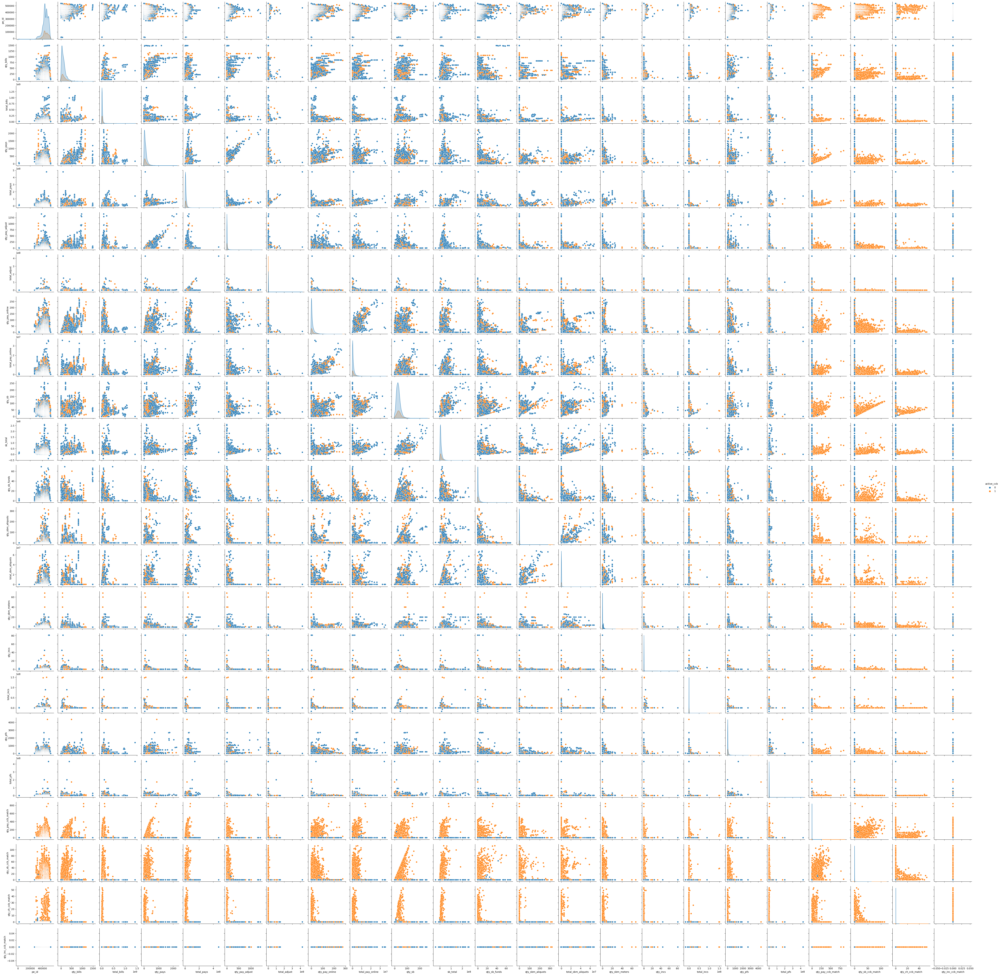

In [21]:
import seaborn as sns
sns.pairplot(data=data, hue='active_ccb')

# tardó 20min 35seg en procesar

### PCA y TSNE
Con esto vamos a tratar de predecir cual de las comunidades tiene activo CCB

In [24]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import seaborn as sns

active_ccb = data[['com_id', 'active_ccb']]
active_ccb

,com_id,active_ccb
0,1003,0
1,1003,0
2,1003,0
3,1003,0
4,1003,0
...,...,...
34902,59396,0
34903,58374,0
34904,55427,1
34905,56746,1


Eliminamos columnas que tienen variables altamente correlacionadas

In [25]:
columns_to_drop = ['pe_id', 'com_id', 'period', 'region', 'total_pays', 'total_adjust', 'total_bills',  'sb_total','total_pay_online', 'total_sbm_funds', 'total_sbm_aliquots', 'total_sbm_meters', 'total_incs', 'active_ccb', 'total_pfs', 'qty_pay_ccb_match', 'qty_sb_ccb_match', 'qty_ch_ccb_match', 'qty_inc_ccb_match']

new_data = data.drop(labels=columns_to_drop, axis='columns')
new_data

,qty_bills,qty_pays,qty_pay_adjust,qty_pay_online,qty_sb,qty_sb_funds,qty_sbm_aliquots,qty_sbm_meters,qty_incs,qty_pfs
0,0.0,26,1,0,23,4,0,0,0,0
1,28.0,31,3,0,22,0,0,0,0,0
2,28.0,26,0,0,22,2,0,0,0,0
3,28.0,31,1,0,25,4,0,0,0,2
4,28.0,28,0,0,26,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...
34902,0.0,0,0,0,0,0,0,0,0,0
34903,0.0,0,0,0,0,0,0,0,0,0
34904,0.0,0,0,0,0,0,0,0,0,0
34905,0.0,0,0,0,0,0,0,0,0,0


Analizamos usando PCA

In [26]:
pca = PCA(n_components=2)
pca.fit(new_data)

PCA(n_components=2)

Hacemos la transformación:

In [27]:
fit_data = pca.transform(new_data)
reduced_data = pd.DataFrame(fit_data, columns=['x', 'y'])
reduced_data

,x,y
0,-161.094895,9.635242
1,-139.037503,1.073880
2,-142.642190,2.187529
3,-138.427421,3.044081
4,-140.789383,2.718522
...,...,...
34902,-179.451699,14.823804
34903,-179.451699,14.823804
34904,-179.451699,14.823804
34905,-179.451699,14.823804


In [28]:
reduced_data['active_ccb'] = active_ccb['active_ccb']
reduced_data

,x,y,active_ccb
0,-161.094895,9.635242,0
1,-139.037503,1.073880,0
2,-142.642190,2.187529,0
3,-138.427421,3.044081,0
4,-140.789383,2.718522,0
...,...,...,...
34902,-179.451699,14.823804,0
34903,-179.451699,14.823804,0
34904,-179.451699,14.823804,1
34905,-179.451699,14.823804,1


Graficamos para evaluar:

<AxesSubplot:xlabel='x', ylabel='y'>

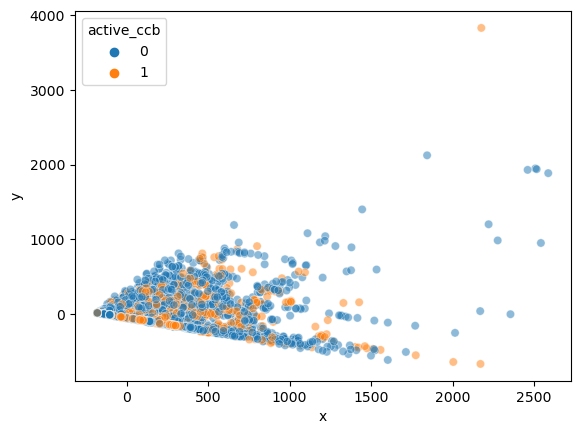

In [29]:
sns.scatterplot(x='x', y='y', hue='active_ccb', data=reduced_data, alpha=0.5)

Analizamos usando TSNE

In [30]:
tsne = TSNE(n_components=2)
tsne.fit(new_data)

/home/dario/anaconda3/envs/proyectofinalCF/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/dario/anaconda3/envs/proyectofinalCF/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


TSNE()

Hacemos la transformación:

In [31]:
tsne_fit_data = tsne.fit_transform(new_data)
reduced_tsne_data = pd.DataFrame(tsne_fit_data, columns=['x', 'y'])
reduced_tsne_data

/home/dario/anaconda3/envs/proyectofinalCF/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/dario/anaconda3/envs/proyectofinalCF/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


,x,y
0,-52.876495,32.401051
1,-37.366882,15.699259
2,-42.883568,16.869278
3,-36.222324,18.253155
4,-38.978916,19.490286
...,...,...
34902,-61.513519,-2.582297
34903,-61.513519,-2.582297
34904,-61.513519,-2.582297
34905,-61.513519,-2.582297


In [32]:
reduced_tsne_data['active_ccb'] = active_ccb['active_ccb']
reduced_tsne_data

,x,y,active_ccb
0,-52.876495,32.401051,0
1,-37.366882,15.699259,0
2,-42.883568,16.869278,0
3,-36.222324,18.253155,0
4,-38.978916,19.490286,0
...,...,...,...
34902,-61.513519,-2.582297,0
34903,-61.513519,-2.582297,0
34904,-61.513519,-2.582297,1
34905,-61.513519,-2.582297,1


Graficamos para evaluar:

<AxesSubplot:xlabel='x', ylabel='y'>

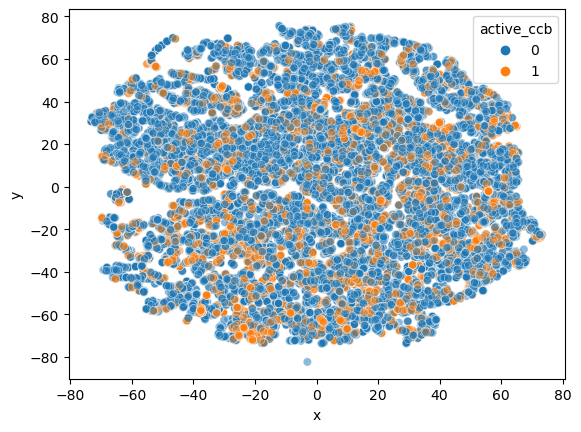

In [33]:
sns.scatterplot(x='x', y='y', hue='active_ccb', data=reduced_tsne_data, alpha=0.5)

### Feature enginering:

Eliminamos las columnas altamente correlacionadas y las que tratamos de predecir

In [34]:
columns_to_drop = ['pe_id', 'com_id', 'period', 'region', 'total_pays', 'total_adjust', 'total_bills',  'sb_total','total_pay_online', 'total_sbm_funds', 'total_sbm_aliquots', 'total_sbm_meters', 'total_incs', 'qty_pay_ccb_match', 'qty_sb_ccb_match', 'qty_ch_ccb_match', 'qty_inc_ccb_match']

data_clean = data.drop(labels=columns_to_drop, axis='columns')
data_clean

,qty_bills,qty_pays,qty_pay_adjust,qty_pay_online,qty_sb,qty_sb_funds,qty_sbm_aliquots,qty_sbm_meters,qty_incs,qty_pfs,total_pfs,active_ccb
0,0.0,26,1,0,23,4,0,0,0,0,0,0
1,28.0,31,3,0,22,0,0,0,0,0,0,0
2,28.0,26,0,0,22,2,0,0,0,0,0,0
3,28.0,31,1,0,25,4,0,0,0,2,94549,0
4,28.0,28,0,0,26,0,0,0,0,1,138615,0
...,...,...,...,...,...,...,...,...,...,...,...,...
34902,0.0,0,0,0,0,0,0,0,0,0,0,0
34903,0.0,0,0,0,0,0,0,0,0,0,0,0
34904,0.0,0,0,0,0,0,0,0,0,0,0,1
34905,0.0,0,0,0,0,0,0,0,0,0,0,1


Dividimos el DataseSet para entrenar:

In [35]:
from sklearn.model_selection import train_test_split

rest, test = train_test_split(data_clean, test_size=0.2, shuffle=True) # Tomamos el 20%
train, val = train_test_split(rest, test_size=0.25, shuffle=True) # 25% de 80%

distributions = [len(train), len(val), len(test)]

print(distributions)
print([dist/len(reduced_data) for dist in distributions])

[20943, 6982, 6982]
[0.5999656229409575, 0.2000171885295213, 0.2000171885295213]


Eliminamos active_ccb del los dataset:

In [36]:
train_x = train.drop(labels=['active_ccb'], axis='columns')
val_x = val.drop(labels=['active_ccb'], axis='columns')
test_x = test.drop(labels=['active_ccb'], axis='columns')
train_x

,qty_bills,qty_pays,qty_pay_adjust,qty_pay_online,qty_sb,qty_sb_funds,qty_sbm_aliquots,qty_sbm_meters,qty_incs,qty_pfs,total_pfs
13510,432.0,280,1,61,54,0,24,0,0,10,250110
13604,277.0,292,64,39,50,8,1,0,0,0,0
16886,182.0,135,0,24,29,2,0,0,0,0,0
32740,51.0,52,7,0,29,2,0,0,0,56,591757
3046,126.0,111,17,12,30,0,0,0,0,100,3597325
...,...,...,...,...,...,...,...,...,...,...,...
27192,44.0,39,0,1,39,3,0,2,0,18,159875
6545,925.0,1478,723,129,77,6,0,0,0,76,2556589
1566,207.0,188,0,24,86,1,0,0,0,164,1228174
29562,125.0,348,65,7,67,2,0,0,0,269,2278077


In [37]:
train_y = train[['active_ccb']].copy()
val_y = val[['active_ccb']].copy()
test_y = test[['active_ccb']].copy()
train_y

,active_ccb
13510,0
13604,1
16886,0
32740,0
3046,1
...,...
27192,0
6545,0
1566,0
29562,1


### Importamos los escaladores:

In [39]:
from sklearn.preprocessing import RobustScaler, StandardScaler, MinMaxScaler, MaxAbsScaler

total_pfs_scaler = MaxAbsScaler()

total_pfs_scaler.fit(train_x[['total_pfs']])

MaxAbsScaler()

Escalamos las variables usando MaxAbsScaler:

In [40]:
scaler = MaxAbsScaler()
scaler.fit(train_x)

MaxAbsScaler()

In [41]:
train_x_scaled = scaler.transform(train_x)
val_x_scaled = scaler.transform(val_x)
test_x_scaled = scaler.transform(test_x)

### Seleccionamos el modelo de 'Regresión logística' y lo entrenamos:

Importamos:

In [42]:
from sklearn.linear_model import LogisticRegression

Creamos un objeto de tipo LogisticRegression al cual entrenamos con nuestras variables definidas previamente

In [43]:
lr = LogisticRegression(C=0.01)
lr.fit(train_x_scaled, train_y)

/home/dario/anaconda3/envs/proyectofinalCF/lib/python3.10/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegression(C=0.01)

Evaluamos el modelo:

In [44]:
train_pred = lr.predict(train_x_scaled)
val_pred = lr.predict(val_x_scaled)

Revisamos las métricas:

In [45]:
from sklearn.metrics import accuracy_score

accuracy_score(train_y, train_pred)

0.8073341928090532

In [46]:
accuracy_score(val_y, val_pred)

0.8109424233743913

### Validando el desempeño en el conjunto de pruebas

In [47]:
test_pred = lr.predict(test_x_scaled)

test_accuracy = accuracy_score(test_y, test_pred)
print(f"test accuracy: {test_accuracy:0.2%}")

test accuracy: 80.87%


## Conclusión:
- Atacando el problema como un problema de clasificación obtenemos un modelo con aprox 80% de efectividad.
- Hay que profundizar utilizando otros modelos.
- La siguiente grafica indica que nuestros datos no están normalmente distribuidos, por lo que hay que considerar reformulas la obtención de datos para una mayor viabilidad.
- En necesario mayor estudios y evolución de pares para pasar el modelo a producción.
- El objetivo es identificar clientes potenciales ya que es una de las ramas donde mas podemos crecer.

Text(0.5, 1.0, 'Target variable distribution\nNo: 16908 (80.73%) | Si: 4035 (19.27%)')

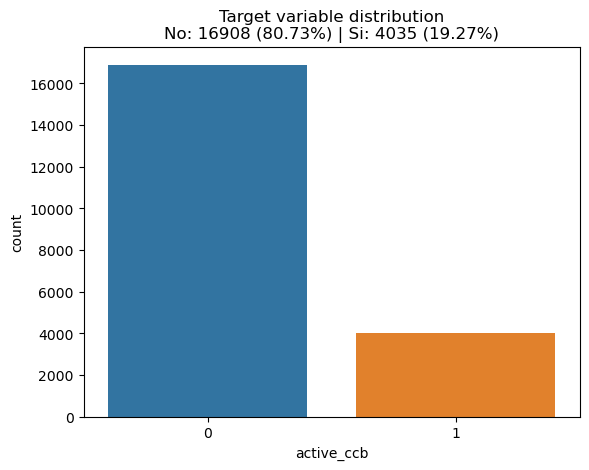

In [48]:
active_ccb_proportion = (train['active_ccb'].value_counts()).to_dict()
ax = sns.countplot(x=train['active_ccb'])
title = ("Target variable distribution\n"
f"No: {active_ccb_proportion[0]} ({(active_ccb_proportion[0]/len(train)):0.02%}) | "
f"Si: {active_ccb_proportion[1]} ({(active_ccb_proportion[1]/len(train)):0.02%})")
ax.set_title(title)